In [1]:
import pandas as pd
import os
import warnings
from tqdm import tqdm
from datetime import datetime
import csv
from skimage import io
import matplotlib.pyplot as plt
import numpy as np




os.environ['PROFILE'] = 'local'
os.environ['NAMESPACE'] = 'production'

from agrobrain_util.runtime.evironment import RuntimeEnv
from agrobrain_util.infra.app_config import application_config as cfg
from agrobrain_apis.atlas.atlas_api import get_metrics, DataQuery

env = RuntimeEnv()
categories_dict = cfg['tags']['categories']

DATA_DIR = "data"

could not find stamp in environment variables
could not find stamp in environment variables
could not find KUBEFLOW_API_BASIC_AUTH_TOKEN in environment variables
could not find AI_RABBITMQ_CONNECTION_STRING in environment variables
could not find AI_MONGO_DB_CONNECTION_STRING in environment variables
could not find TARANIS_DB_CONNECTION_STRING in environment variables
could not find GLOBAL_DB_CONNECTION_STRING in environment variables
could not find AI_MONGO_DB_CONNECTION_STRING_NEW in environment variables


In [24]:
# interestinf_features_from_orders_df = ['Order ID', 'Status', 'Finish Uploading Time', 'Pass #', 'Instructions', 'Crop', 'Sensor System', '# Of Images', '# Of Images To Tag']

In [28]:
# # GET ORDERS DATAFRAME AND SAVE TO CSV

# dq = DataQuery(crop= ["Corn","Soybean"], instructions= ["Insects + Nutritional Deficiencies + Disease + Weeds (Species)"],
#                country= ["United States"], order_status= ["Done"], sensor_type= ["dji-M300"])
# my_data = get_metrics(dq, [], from_timestamp=1649578890000, to_timestamp=1664582400000)


# keys = my_data[0]['data']['fields'].keys()
# data_for_csv =[my_data[i]['data']['fields'] for i in range(len(my_data))]
# file_path = os.path.join(DATA_DIR, 'orders_2022_late_flights.csv')
# with open(file_path, 'w', newline='') as output_file:
#     dict_writer = csv.DictWriter(output_file, keys)
#     dict_writer.writeheader()
#     dict_writer.writerows(data_for_csv)

In [2]:
# CHECK ORDERS DF

file_path = os.path.join(DATA_DIR, 'orders_2022_late_flights.csv')
orders_df = pd.read_csv(file_path)


orders_df['Order ID'] = pd.to_numeric(orders_df['Order ID'], errors='coerce').fillna(-1).astype(int)
orders_list = list(orders_df['Order ID'])

In [4]:
file_path = os.path.join(DATA_DIR, 'orders_2022_late_flights.csv')
orders_df = pd.read_csv(file_path)
orders_df['Order ID'] = pd.to_numeric(orders_df['Order ID'], errors='coerce').fillna(-1).astype(int)

orders_df = orders_df.rename(columns={'Order ID': 'orderID'})

im_df = pd.read_csv(os.path.join(DATA_DIR, "images_2022_late_flights.csv"))
im_df = im_df[(im_df['cameraAngle'] > -95) & (im_df['cameraAngle'] < -85)]
im_df = im_df[im_df['deleted'] != True]

merged_df = im_df.merge(orders_df, on='orderID')
merged_df['pass_num'] = [int(eval(merged_df['Pass #'][i])['value']) for i in range(len(merged_df))]
orders_df = 0
im_df = 0

/tmp/ipykernel_26996/4079636493.py:7: DtypeWarning: Columns (32,48) have mixed types. Specify dtype option on import or set low_memory=False.
  im_df = pd.read_csv(os.path.join(DATA_DIR, "images_2022_late_flights.csv"))


In [2]:
merged_df.to_csv(os.path.join(DATA_DIR, "images_2022_late_flights_full_4.csv"))

NameError: name 'merged_df' is not defined

In [12]:
merged_df = merged_df.reset_index(drop=True)

In [10]:
import numpy as np
# np.unique(merged_df['pass_num'])
pass_numbers = np.unique(merged_df['pass_num'])
pass_num_df_dict = {key: None for key in pass_numbers}

In [19]:
len(pass_num_df_dict[4])

130196

In [14]:
for pass_num in pass_numbers:
    pass_num_df_dict[pass_num] = merged_df[merged_df['pass_num'] == pass_num]

In [6]:
merged_df['pass_num'] = [int(eval(merged_df['Pass #'][i])['value']) for i in range(len(merged_df))]

In [11]:
# # ADD IMAGES DATA BY ORDER ID FROM ETI

# example_order_id = int(orders_df['Order ID'][0])
# example_images_df = env.eti_api.get_images_data_by_orderid(example_order_id)['images']
# images_df = pd.DataFrame(columns=example_images_df[0].keys())

# # folder_dir = '/mnt/disks/datasets/wide_images/images_df_folder_1'
# folder_dir = os.path.join(DATA_DIR, "images_df_folder_2022_late_flights_1")

# os.makedirs(folder_dir, exist_ok=True)
# with warnings.catch_warnings():
#     warnings.filterwarnings("ignore", category=FutureWarning)
#     for i in tqdm(range(8064, len(orders_list))):
#         order = orders_list[i]
#         order_df = pd.DataFrame(env.eti_api.get_images_data_by_orderid(order)['images'])
#         images_df = pd.concat([images_df, order_df], axis='rows', ignore_index=True)
#         if len(images_df) > 500:
#             # images_df.to_csv(f"/mnt/disks/datasets/wide_images/images_df_folder_1/images_df_{i}.csv")
#             images_df.to_csv(os.path.join(folder_dir, f"images_df_{i}.csv"))

#             images_df = pd.DataFrame(columns=example_images_df[0].keys())
#     images_df.to_csv(os.path.join(folder_dir, f"images_df_{i}.csv"))

100%|██████████| 4149/4149 [1:35:19<00:00,  1.38s/it]


In [12]:
# # CONCAT ALL THE SMALL DATAFRAMES
# import glob
# folders_path = os.path.join(DATA_DIR, "images_df_folder_2022_late_flights_1")

# # weeds_images_df = pd.read_csv(os.path.join(DATA_DIR, "images_2022_late_flights.csv"))

# csv_list = glob.glob(os.path.join(folders_path, "*.csv"))
# im_df = pd.DataFrame()
# for csv in tqdm(csv_list):
#     df = pd.read_csv(csv)
#     im_df = pd.concat([im_df, df], axis='rows', ignore_index=True)
# # im_df.to_csv('/mnt/disks/datasets/wide_images/images_df.csv')
# im_df.to_csv(os.path.join(DATA_DIR, "images_2022_late_flights.csv"))

100%|██████████| 1960/1960 [03:32<00:00,  9.20it/s]


In [7]:
# # CONCAT SMALL IMAGES DF TO FULL IMAGES_DF

# chunk_size = 10000
# im_df = pd.DataFrame()
# for chunk in pd.read_csv(os.path.join(DATA_DIR, "images_2022_late_flights.csv"), chunksize=chunk_size):
#     # chunk_im_df = pd.read_csv(os.path.join(DATA_DIR, "images_2022_late_flights.csv"), chunksize=chunk_size)
#     im_df = pd.concat([im_df, chunk], axis='rows', ignore_index=True)

# print(len(im_df))
# # im_df.head()

1128376


In [3]:
im_df = pd.read_csv(os.path.join(DATA_DIR, "images_2022_late_flights_full_6.csv"))

/tmp/ipykernel_57902/3223737167.py:1: DtypeWarning: Columns (33,49,73) have mixed types. Specify dtype option on import or set low_memory=False.
  im_df = pd.read_csv(os.path.join(DATA_DIR, "images_2022_late_flights_full_4.csv"))


In [4]:
im_df.columns

Index(['Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0', 'imageID', 'identifier',
       'parcelID', 'snapshotDate', 'timeGps', 'uploadDate', 'fieldID',
       'cropID', 'flightID', 'clientID', 'heightAboveGround', 'quality', 'lat',
       'lon', 'flag', 'healthy', 'expertReview', 'taggerReview', 'taggerDone',
       'autoDone', 'blackList', 'hasTiles', 'format', 'height', 'width',
       'focalLength', 'deleted', 'comment', 'stats', 'stamp', 'plantReport',
       'orderID', 'cameraFileName', 'ignored', 'flightTargetHeight',
       'cameraDegree', 'contrast', 'brightness', 'sharpness', 'typeId',
       'groupUUID', 'cameraModel', 'footprintArea', 'footprintGeography',
       'objectDistance', 'cameraAngle', 'tagsLastVersion', 'imgUrl',
       'fieldName', 'farmID', 'farmName', 'clientName', 'fieldGeojson',
       'cropName', '# Of Images', '# Of Images To Tag', 'Crop',
       'Sensor System', 'Updated', 'Country',
       '# of images tagged fully automatically (final)',
       '# of images

In [13]:
im_df.columns

Index(['Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0', 'imageID', 'identifier',
       'parcelID', 'snapshotDate', 'timeGps', 'uploadDate', 'fieldID',
       'cropID', 'flightID', 'clientID', 'heightAboveGround', 'quality', 'lat',
       'lon', 'flag', 'healthy', 'expertReview', 'taggerReview', 'taggerDone',
       'autoDone', 'blackList', 'hasTiles', 'format', 'height', 'width',
       'focalLength', 'deleted', 'comment', 'stats', 'stamp', 'plantReport',
       'orderID', 'cameraFileName', 'ignored', 'flightTargetHeight',
       'cameraDegree', 'contrast', 'brightness', 'sharpness', 'typeId',
       'groupUUID', 'cameraModel', 'footprintArea', 'footprintGeography',
       'objectDistance', 'cameraAngle', 'tagsLastVersion', 'imgUrl',
       'fieldName', 'farmID', 'farmName', 'clientName', 'fieldGeojson',
       'cropName', '# Of Images', '# Of Images To Tag', 'Crop',
       'Sensor System', 'Updated', 'Country',
       '# of images tagged fully automatically (final)',
       '# of images

In [19]:
im_df.columns

Index(['imageID', 'identifier', 'parcelID', 'snapshotDate', 'timeGps',
       'uploadDate', 'fieldID', 'cropID', 'flightID', 'clientID',
       'heightAboveGround', 'quality', 'lat', 'lon', 'flag', 'healthy',
       'expertReview', 'taggerReview', 'blackList', 'hasTiles', 'format',
       'height', 'width', 'focalLength', 'deleted', 'comment', 'stats',
       'stamp', 'plantReport', 'orderID', 'cameraFileName', 'ignored',
       'flightTargetHeight', 'cameraDegree', 'contrast', 'brightness',
       'typeId', 'groupUUID', 'cameraModel', 'footprintArea', 'cameraAngle',
       'tagsLastVersion', 'imgUrl', 'fieldName', 'farmID', 'cropName',
       '# Of Images', '# Of Images To Tag', 'Crop', 'Sensor System',
       '# of images tagged manually (final)', 'Pass #', 'Instructions',
       'pass_num'],
      dtype='object')

In [20]:
# im_df.drop(['footprintGeography', 'objectDistance', 'sharpness', 'taggerDone', 'clientName', 'fieldGeojson', 'farmName'], axis=1, inplace=True)

im_df.to_csv(os.path.join(DATA_DIR, "images_2022_late_flights_full_6.csv"))

: 

# split dataframes by pass number

In [2]:
# SPLIT IMAGES DATAFRAME TO DATAFRAMES BY PASS NUMBER AND SAVE

im_df = pd.read_csv(os.path.join(DATA_DIR, "images_2022_late_flights_full_6.csv"))
# im_df = im_df[:1000]

pass_numbers = np.unique(im_df['pass_num'])
pass_num_df_dict = {key: None for key in pass_numbers}

for pass_num in pass_numbers:
    pass_num_df_dict[pass_num] = im_df[im_df['pass_num'] == pass_num].reset_index(drop=True)
    

sub_dataframes_folder = os.path.join(DATA_DIR, "sub_dataframes_by_pass_num")
os.makedirs(sub_dataframes_folder, exist_ok=True)

for pass_num in pass_num_df_dict.keys():
    file_name = f"images_2022_late_flights_pass_num_{pass_num}.csv"
    file_path = os.path.join(sub_dataframes_folder, file_name)
    # SAVE
    # pass_num_df_dict[pass_num].to_csv(file_path)


/tmp/ipykernel_82745/2983846868.py:1: DtypeWarning: Columns (33,49,73) have mixed types. Specify dtype option on import or set low_memory=False.
  im_df = pd.read_csv(os.path.join(DATA_DIR, "images_2022_late_flights_full_4.csv"))


100%|██████████| 821/821 [00:00<00:00, 6488.71it/s]


<function matplotlib.pyplot.show(close=None, block=None)>

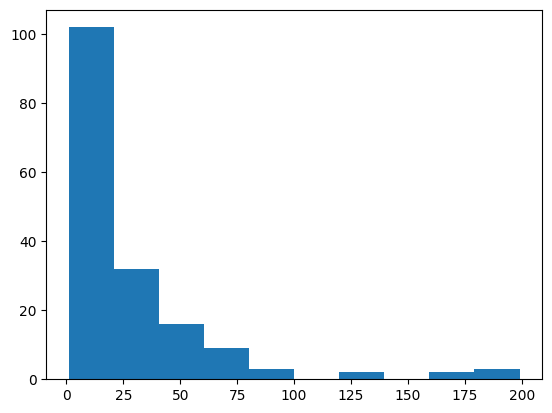

In [56]:
# READ CSV BY PASS NUMBER AND 

pass_num = 6

sub_dataframes_folder = os.path.join(DATA_DIR, "sub_dataframes_by_pass_num")
file_name = f"images_2022_late_flights_pass_num_{pass_num}.csv"
file_path = os.path.join(sub_dataframes_folder, file_name)
pass_num_df = pd.read_csv(file_path)

# sample_from_df = pass_num_df.sample(n=10)

# ADD NUM WEED TAGS TO DATAFRAME
categories_dict = cfg['tags']['categories']
pass_num_df["num_weed_tags"] = None
for i, im_id in enumerate(tqdm(pass_num_df["imageID"])):
    image_stats_list = eval(pass_num_df['stats'][i])
    image_weed_tags_count = 0
    for cat in image_stats_list:
        if cat['category'] == categories_dict['weed']:
            image_weed_tags_count += cat['tagsCount']
    pass_num_df.loc[pass_num_df['imageID'] == im_id, "num_weed_tags"] = image_weed_tags_count

pass_num_df = pass_num_df.sort_values(by='num_weed_tags', ascending=False)


plt.hist(pass_num_df[pass_num_df['num_weed_tags'] > 0]['num_weed_tags'])
plt.show

# len(pass_num_df)

In [53]:
pass_num_df = pass_num_df.sort_values(by='num_weed_tags', ascending=False)

Zoom image id: 15051274
Wide image id: 15051573


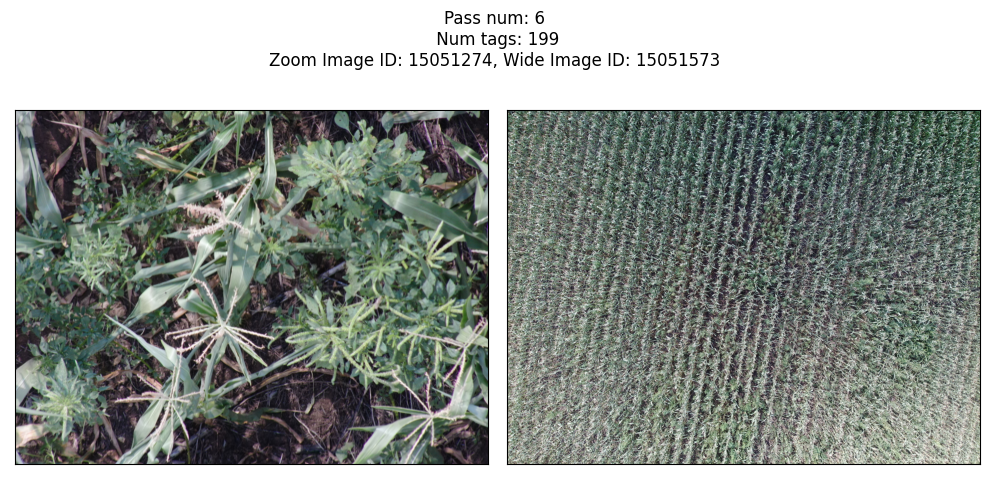

Zoom image id: 15020925
Wide image id: 15026695


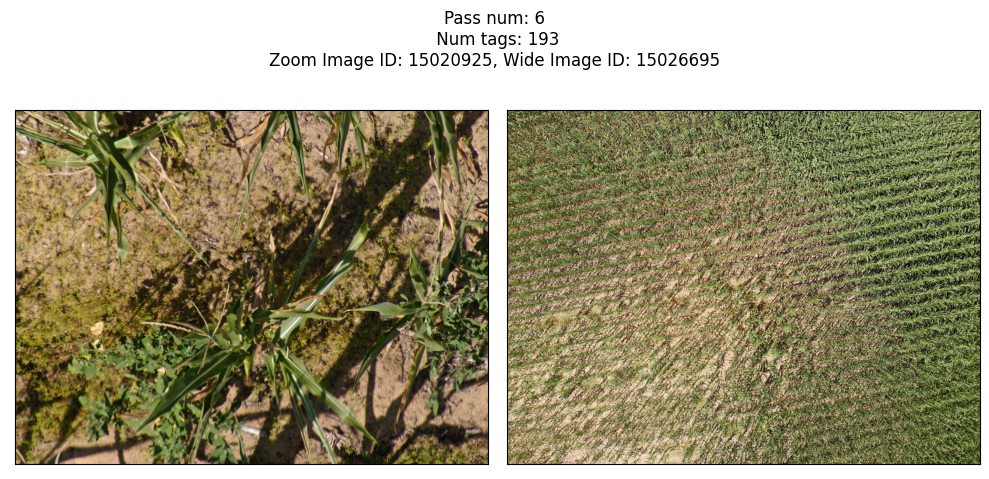

Zoom image id: 15020334
Wide image id: 15025916


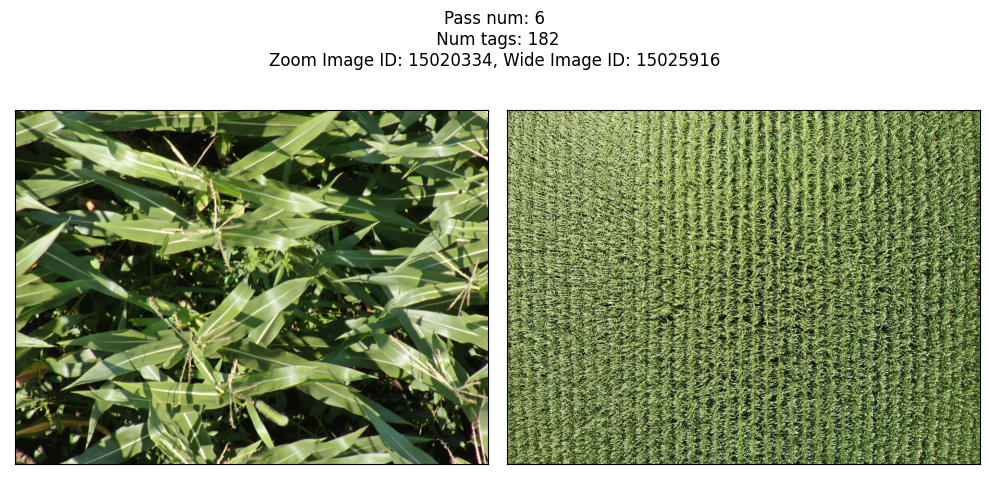

Zoom image id: 15024006
Wide image id: 15031104


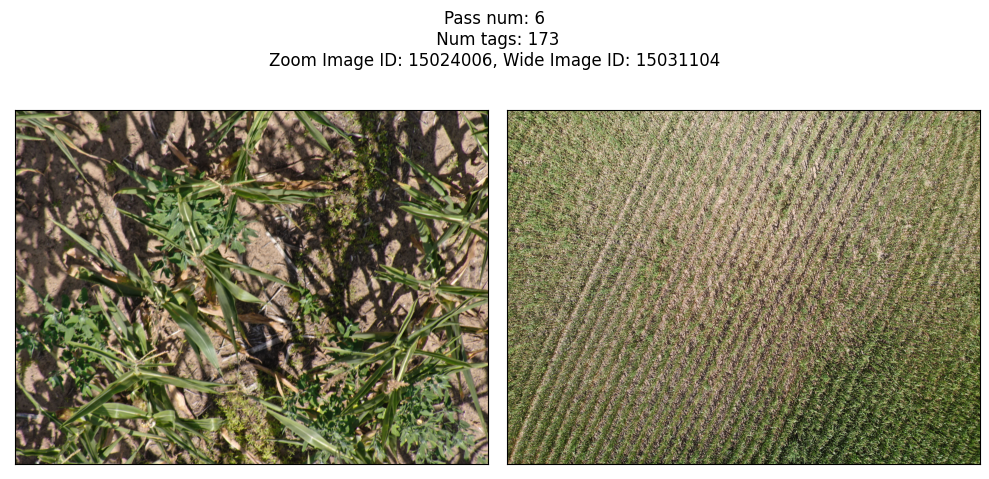

Zoom image id: 15051791
Wide image id: 15052151


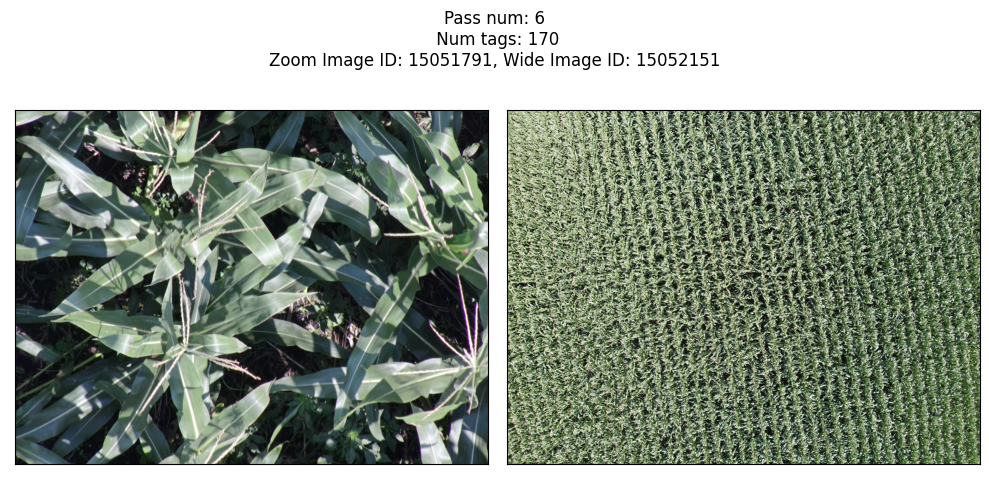

Zoom image id: 15050044
Wide image id: 15050564


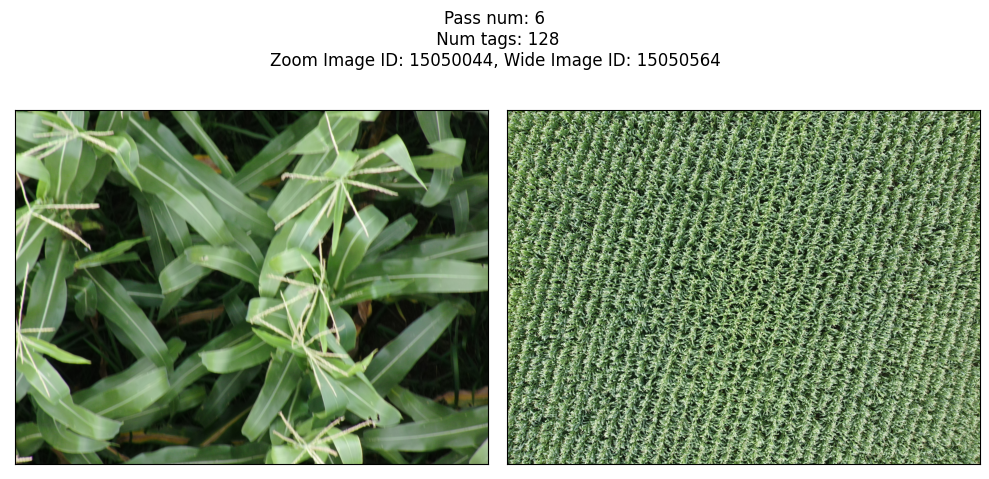

Zoom image id: 15051881
Wide image id: 15052275


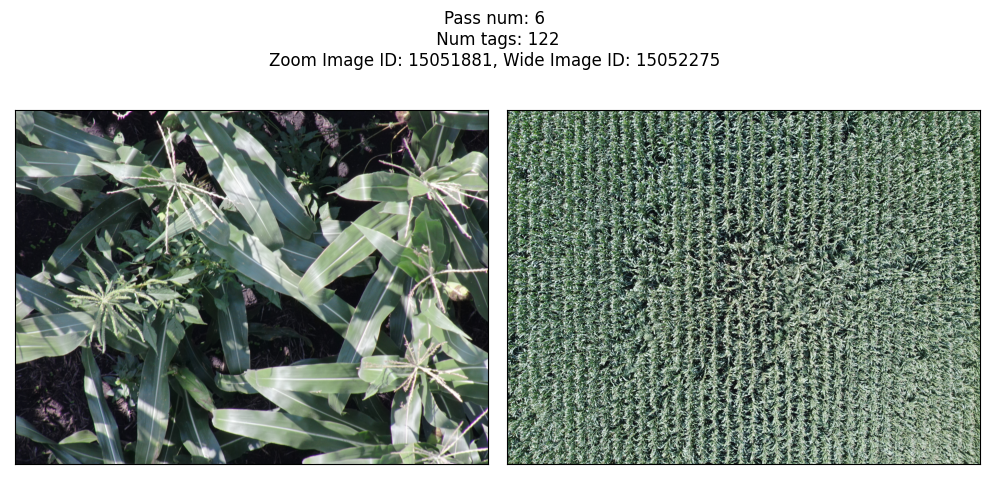

Zoom image id: 15050264
Wide image id: 15051104


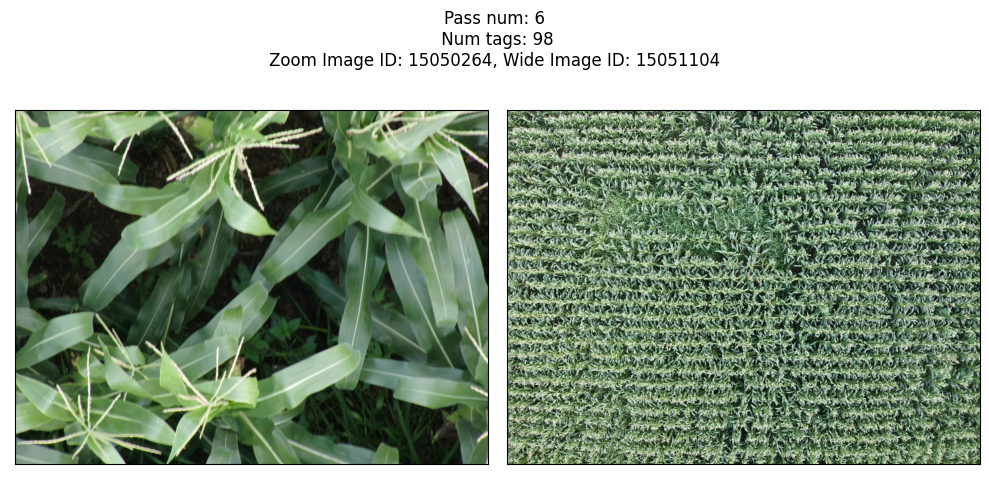

Zoom image id: 15046383
Wide image id: 15048764


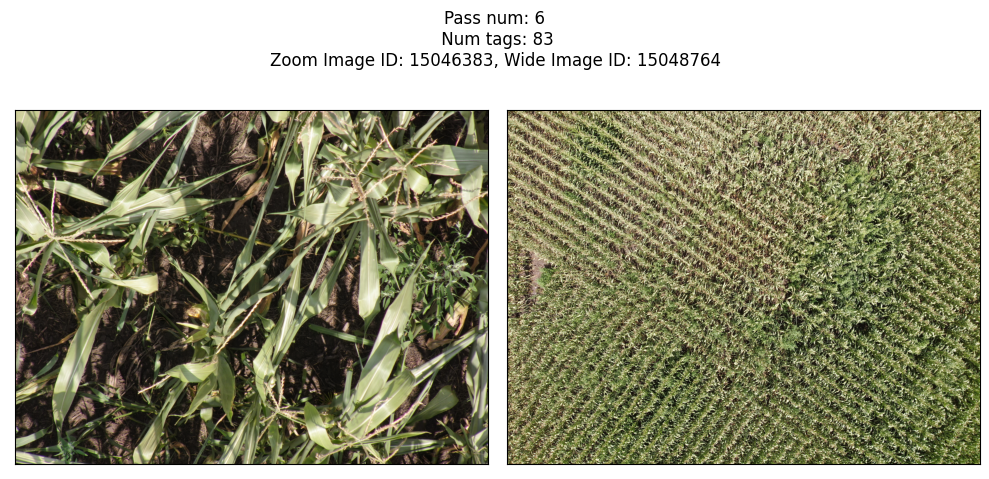

Zoom image id: 15022506
Wide image id: 15028879


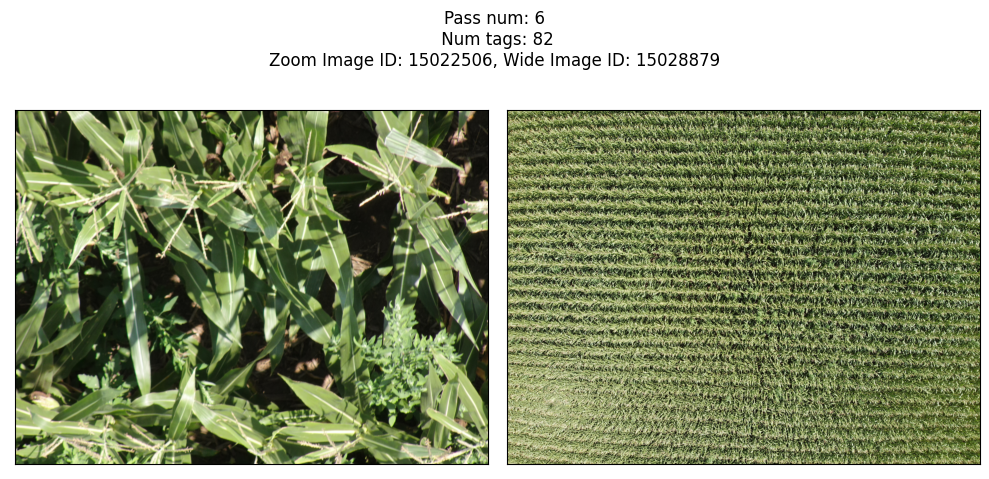

In [57]:
# SHOW ZOOM-WIDE COUPLE OF IMAGES FROM THE DATAFRAME

# df_to_show = pass_num_df[pass_num_df['num_weed_tags'] > 0]

df_to_show = pass_num_df.head(10).reset_index(drop=True)
# df_to_show = df_to_show.sample(n=10).reset_index(drop=True)
df_to_show['wideImageID'] = env.eti_api.get_matching_wide_images(list(df_to_show['imageID']))

for i in range(len(df_to_show)):
    example_image_id = df_to_show['imageID'][i]
    # SHOW IMAGES
    print(f"Zoom image id: {example_image_id}")
    image_data = df_to_show[df_to_show['imageID'] == example_image_id].reset_index(drop=True)

    # image_data = df_to_show[df_to_show['imageID'] == example_image_id]
    matching_wide_image_id = int(image_data.at[0, 'wideImageID'])
    print(f"Wide image id: {matching_wide_image_id}")
    image_num_tags = image_data.at[0, 'num_weed_tags']
    # image_num_manual_tags = image_data.at[0, 'weed_manualTagsCount']
    # image_num_inference_tags = image_data.at[0, 'weed_inferenceTagsCount']

    image_crop_name = image_data.at[0, 'cropName']
    # upload_date = image_data.at[0, 'uploadDate_date']
    # weed_types = image_data.at[0, 'weed_types_ids_list']
    # weed_types = eval(image_data.at[0, 'weed_types_ids_list'])
    # weed_types = list(map(cat_dict_names.get, weed_types))


    im_path = env.download_image(int(example_image_id))
    image = io.imread(im_path)

    wide_im_path = env.download_image(int(matching_wide_image_id))
    wide_image = io.imread(wide_im_path)

    fig, axes = plt.subplots(nrows=1, ncols=2)
    axes[0].imshow(image, extent=[0, image.shape[1], 0, image.shape[0]])
    axes[1].imshow(wide_image, extent=[0, wide_image.shape[1], 0, wide_image.shape[0]])


    for ax in axes:
        ax.set_xticks([])
        ax.set_yticks([])
    fig.set_size_inches(10, 5)
    # plt.suptitle(f"Crop Type: {image_crop_name}\nZoom Image ID: {example_image_id}, Wide Image ID: {matching_wide_image_id}\nuploadDate: {upload_date}\nNum Weed Tags: {image_num_tags}\nManual tags: {image_num_manual_tags}, Inference tags: {image_num_inference_tags}\nWeed types: {weed_types}")
    plt.suptitle(f"Pass num: {pass_num}\n Num tags: {image_num_tags}\nZoom Image ID: {example_image_id}, Wide Image ID: {matching_wide_image_id}")
    plt.tight_layout()
    plt.show()


In [ ]:
# SHOW IMAGES FROM THE DATAFRAME
from skimage import io
import matplotlib.pyplot as plt


# df_to_show = df_for_resolution_lim_checkup[20:].reset_index(drop=True)
df_to_show = sample_from_df.reset_index(drop=True)

for i in range(len(df_to_show)):
    example_image_id = df_to_show['imageID'][i]
    # SHOW IMAGES
    print(f"Zoom image id: {example_image_id}")
    image_data = df_to_show[df_to_show['imageID'] == example_image_id].reset_index(drop=True)
    pass_num = image_data.at[0, 'pass_num']

    im_path = env.download_image(int(example_image_id))
    image = io.imread(im_path)

    # wide_im_path = env.download_image(int(matching_wide_image_id))
    # wide_image = io.imread(wide_im_path)

    fig, axes = plt.subplots(nrows=1, ncols=1)
    axes.imshow(image, extent=[0, image.shape[1], 0, image.shape[0]])
    # axes[1].imshow(wide_image, extent=[0, wide_image.shape[1], 0, wide_image.shape[0]])


    axes.set_xticks([])
    axes.set_yticks([])
    fig.set_size_inches(20, 10)
    plt.suptitle(f"pass num: {pass_num}")
    # plt.suptitle(f"Crop Type: {image_crop_name}\nZoom Image ID: {example_image_id}\nuploadDate: {upload_date}\nNum Weed Tags: {image_num_tags}\nManual tags: {image_num_manual_tags}, Inference tags: {image_num_inference_tags}\nWeed types: {weed_types}")
    # plt.suptitle(f"Crop Type: {image_crop_name}\nZoom Image ID: {example_image_id}, Wide Image ID: {matching_wide_image_id}\nuploadDate: {upload_date}\nNum Weed Tags: {image_num_tags}\nManual tags: {image_num_manual_tags}, Inference tags: {image_num_inference_tags}\nWeed types: {weed_types}")

    plt.tight_layout()
    plt.show()


In [3]:
sample_from_df.columns

Index(['Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0', 'imageID',
       'identifier', 'parcelID', 'snapshotDate', 'timeGps', 'uploadDate',
       'fieldID', 'cropID', 'flightID', 'clientID', 'heightAboveGround',
       'quality', 'lat', 'lon', 'flag', 'healthy', 'expertReview',
       'taggerReview', 'taggerDone', 'autoDone', 'blackList', 'hasTiles',
       'format', 'height', 'width', 'focalLength', 'deleted', 'comment',
       'stats', 'stamp', 'plantReport', 'orderID', 'cameraFileName', 'ignored',
       'flightTargetHeight', 'cameraDegree', 'contrast', 'brightness',
       'sharpness', 'typeId', 'groupUUID', 'cameraModel', 'footprintArea',
       'footprintGeography', 'objectDistance', 'cameraAngle',
       'tagsLastVersion', 'imgUrl', 'fieldName', 'farmID', 'farmName',
       'clientName', 'fieldGeojson', 'cropName', '# Of Images',
       '# Of Images To Tag', 'Crop', 'Sensor System', 'Updated', 'Country',
       '# of images tagged fully automatically (final)',
   